In [1]:
%load_ext autoreload
%autoreload 2
    
import os, sys

sys.path.insert(0, "../")
print(sys.path)
#otherwise leidenalg is used in an outdated version ...

import networkx as nx
import leidenalg as la
print("la", la.version)

%autoreload 2
from mikg.kgraph import *
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from collections import defaultdict, Counter

import random
random.seed(42)

import pickle

['../', '', '/opt/jhub/lib/python3.11/site-packages', '/opt/jhub/lib64/python3.11/site-packages', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python311.zip', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/lib-dynload', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages']
la 0.10.2


In [2]:
kg = KGraph()
kg.load_kgraph("../data/initial_base_graph.out")

In [3]:
exprKGs = None
exprKGs = pickle.load(open("ctcond_exprkgs.pickle", "rb"))

In [4]:
#'ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref', 'CNT_AKI'
tissue2zone2kg = defaultdict(lambda : dict())
for x in exprKGs:
    celltype, condition = x.split("_",1)
    
    tissue2zone2kg[celltype]["{}_{}".format(celltype, condition)] = exprKGs[x]

In [5]:
for x in tissue2zone2kg:
    print(x, len(tissue2zone2kg[x]), [x for x in tissue2zone2kg[x]])

ATL 5 ['ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref']
CNT 5 ['CNT_AKI', 'CNT_COV_AKI', 'CNT_DKD', 'CNT_H_CKD', 'CNT_Ref']
DCT 5 ['DCT_AKI', 'DCT_COV_AKI', 'DCT_DKD', 'DCT_H_CKD', 'DCT_Ref']
DTL 5 ['DTL_AKI', 'DTL_COV_AKI', 'DTL_DKD', 'DTL_H_CKD', 'DTL_Ref']
EC 5 ['EC_AKI', 'EC_COV_AKI', 'EC_DKD', 'EC_H_CKD', 'EC_Ref']
FIB 5 ['FIB_AKI', 'FIB_COV_AKI', 'FIB_DKD', 'FIB_H_CKD', 'FIB_Ref']
IC 5 ['IC_AKI', 'IC_COV_AKI', 'IC_DKD', 'IC_H_CKD', 'IC_Ref']
IMM 5 ['IMM_AKI', 'IMM_COV_AKI', 'IMM_DKD', 'IMM_H_CKD', 'IMM_Ref']
NEU 5 ['NEU_AKI', 'NEU_COV_AKI', 'NEU_DKD', 'NEU_H_CKD', 'NEU_Ref']
PC 5 ['PC_AKI', 'PC_COV_AKI', 'PC_DKD', 'PC_H_CKD', 'PC_Ref']
PEC 5 ['PEC_AKI', 'PEC_COV_AKI', 'PEC_DKD', 'PEC_H_CKD', 'PEC_Ref']
POD 5 ['POD_AKI', 'POD_COV_AKI', 'POD_DKD', 'POD_H_CKD', 'POD_Ref']
PT 5 ['PT_AKI', 'PT_COV_AKI', 'PT_DKD', 'PT_H_CKD', 'PT_Ref']
PapE 5 ['PapE_AKI', 'PapE_COV_AKI', 'PapE_DKD', 'PapE_H_CKD', 'PapE_Ref']
TAL 5 ['TAL_AKI', 'TAL_COV_AKI', 'TAL_DKD', 'TAL_H_CKD', 'TAL_Ref'

In [6]:
renameClass = "VSM/P"
renameElems = tissue2zone2kg[renameClass]

newclass = renameClass.replace("/", "-")

tissue2zone2kg[newclass] = dict()
for x in renameElems:
    newElem = x.replace("/", "-")
    tissue2zone2kg[newclass][newElem] = renameElems[x]


if renameClass in tissue2zone2kg:
    del tissue2zone2kg[renameClass]

for x in tissue2zone2kg:
    print(x, len(tissue2zone2kg[x]), [x for x in tissue2zone2kg[x]])

ATL 5 ['ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref']
CNT 5 ['CNT_AKI', 'CNT_COV_AKI', 'CNT_DKD', 'CNT_H_CKD', 'CNT_Ref']
DCT 5 ['DCT_AKI', 'DCT_COV_AKI', 'DCT_DKD', 'DCT_H_CKD', 'DCT_Ref']
DTL 5 ['DTL_AKI', 'DTL_COV_AKI', 'DTL_DKD', 'DTL_H_CKD', 'DTL_Ref']
EC 5 ['EC_AKI', 'EC_COV_AKI', 'EC_DKD', 'EC_H_CKD', 'EC_Ref']
FIB 5 ['FIB_AKI', 'FIB_COV_AKI', 'FIB_DKD', 'FIB_H_CKD', 'FIB_Ref']
IC 5 ['IC_AKI', 'IC_COV_AKI', 'IC_DKD', 'IC_H_CKD', 'IC_Ref']
IMM 5 ['IMM_AKI', 'IMM_COV_AKI', 'IMM_DKD', 'IMM_H_CKD', 'IMM_Ref']
NEU 5 ['NEU_AKI', 'NEU_COV_AKI', 'NEU_DKD', 'NEU_H_CKD', 'NEU_Ref']
PC 5 ['PC_AKI', 'PC_COV_AKI', 'PC_DKD', 'PC_H_CKD', 'PC_Ref']
PEC 5 ['PEC_AKI', 'PEC_COV_AKI', 'PEC_DKD', 'PEC_H_CKD', 'PEC_Ref']
POD 5 ['POD_AKI', 'POD_COV_AKI', 'POD_DKD', 'POD_H_CKD', 'POD_Ref']
PT 5 ['PT_AKI', 'PT_COV_AKI', 'PT_DKD', 'PT_H_CKD', 'PT_Ref']
PapE 5 ['PapE_AKI', 'PapE_COV_AKI', 'PapE_DKD', 'PapE_H_CKD', 'PapE_Ref']
TAL 5 ['TAL_AKI', 'TAL_COV_AKI', 'TAL_DKD', 'TAL_H_CKD', 'TAL_Ref'

In [ ]:
tissue2zone2kg["FIB"]

In [ ]:
short_t2z2k = {}
short_t2z2k["FIB"] = tissue2zone2kg["FIB"]
short_t2z2k["EC"] = tissue2zone2kg["EC"]

with open("short_t2z2k.pickle", 'wb') as f:    
    pickle.dump(short_t2z2k, f)

In [ ]:
kg = KGraph()
kg.load_kgraph("../data/initial_base_graph.out")

with open("short_t2z2k.pickle", 'rb') as f:    
    short_t2z2k = pickle.load(f)

In [8]:
zoneSort = {
        "Ref": 0,
        "AKI": 1,
        "COV_AKI": 2,
        "DKD": 3,
        "H_CKD": 4
    }

tlda = TwoLevelDifferentialAnalysis(tissue2zone2kg, [x for x in zoneSort], output_folder_formatter="diff_{}/", fullKG=kg)

In [9]:
tlda.calculate_modules(relevant_cellgroups=None)

ATL


/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_stats_py.py:6556: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1113: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/si

{'ATL_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_COV_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_DKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_H_CKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges}
Analysing ATL_AKI
Identified communities
Number of communities: 257
Average community size 38.80544747081712
Median community size 30.0
Quantile (0,0.25,0.5,0.75,1) community size [  2.  18.  30.  47. 306.]
Significant communities
Number of communities: 182
Average community size 44.22527472527472
Median community size 34.0
Quantile (0,0.25,0.5,0.75,1) community size [ 10.  21.  34.  54. 306.]
ATL_AKI_mod_166 10
ATL_AKI_mod_76 151
ATL_AKI_mod_203 17
ATL_AKI_mod_10 306
ATL_AKI_mod_251 12
ATL_AKI_mod_225 11
ATL_AKI_mod_57 22
ATL_AKI_mod_28 98
ATL_AKI_mod_212 17
ATL_AKI_mod_12 16
ATL_AKI_mod_60 16
ATL_AKI_mod_215 13
ATL_AKI_mod_180 27
ATL_AKI_mod_34 95
ATL_AKI_mod_210 15
ATL_AKI_mod_202 20
ATL_AKI_m

/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:573: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  res = hypotest_fun_out(*samples, **kwds)


Significant communities
Number of communities: 8
Average community size 23.0
Median community size 23.0
Quantile (0,0.25,0.5,0.75,1) community size [11.   15.   23.   28.75 36.  ]
PC_H_CKD_mod_130 24
PC_H_CKD_mod_165 15
PC_H_CKD_mod_151 22
PC_H_CKD_mod_79 36
PC_H_CKD_mod_129 27
PC_H_CKD_mod_47 34
PC_H_CKD_mod_153 15
PC_H_CKD_mod_60 11
Number of saved communities: 5
PEC
{'PEC_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'PEC_COV_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'PEC_DKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'PEC_H_CKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges}
Analysing PEC_AKI
Identified communities
Number of communities: 288
Average community size 49.1875
Median community size 37.0
Quantile (0,0.25,0.5,0.75,1) community size [  2.  22.  37.  64. 343.]
Significant communities
Number of communities: 52
Average community size 45.19230769230769
Median community size 33.0
Quantile (0,0.25,0

In [17]:
[(x, type(tlda.__dict__[x])) for x in tlda.__dict__]

[('tldict', dict),
 ('sorted_zones', list),
 ('name_sep', str),
 ('cellgroupdata', mikg.kgraph.DefaultDict),
 ('fullKG', mikg.kgraph.KGraph),
 ('output_folder_formatter', str),
 ('recalc_warning', bool)]

In [18]:
with open("kpmp_tlda.pickle", 'wb') as f:    
    pickle.dump(tlda, f)

In [ ]:
import pickle

with open("kpmp_tlda.pickle", 'rb') as f:    
    tlda = pickle.load(f)

In [33]:
tlda.plot_module_comparisons(plot_communities=False)

Output directory diff_ATL/
diff_ATL//all_module_heatmap.png
23.25


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).


diff_ATL//all_module_compare.png


Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTICKS (155).
Locator attempting to generate 159 ticks ([-2.0, ..., 156.0]), which exceeds Locator.MAXTIC

Output directory diff_CNT/
diff_CNT//all_module_heatmap.png
16.5


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ti

diff_CNT//all_module_compare.png


Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTICKS (110).
Locator attempting to generate 114 ticks ([-2.0, ..., 111.0]), which exceeds Locator.MAXTIC

Output directory diff_DCT/
diff_DCT//all_module_heatmap.png
16.65


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).


diff_DCT//all_module_compare.png


Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTICKS (111).
Locator attempting to generate 115 ticks ([-2.0, ..., 112.0]), which exceeds Locator.MAXTIC

Output directory diff_DTL/
diff_DTL//all_module_heatmap.png
17.7


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).


diff_DTL//all_module_compare.png


Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTIC

Output directory diff_EC/
diff_EC//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, .

6.6
diff_EC//all_module_compare.png


Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting to generate 48 ticks ([-2.0, ..., 45.0]), which exceeds Locator.MAXTICKS (44).
Locator attempting t

Output directory diff_FIB/
diff_FIB//all_module_heatmap.png
20.849999999999998


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ti

diff_FIB//all_module_compare.png


Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTICKS (139).
Locator attempting to generate 143 ticks ([-2.0, ..., 140.0]), which exceeds Locator.MAXTIC

Output directory diff_IC/
diff_IC//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).


10.049999999999999
diff_IC//all_module_compare.png


Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting to generate 71 ticks ([-2.0, ..., 68.0]), which exceeds Locator.MAXTICKS (67).
Locator attempting t

Output directory diff_IMM/
diff_IMM//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).


6.8999999999999995
diff_IMM//all_module_compare.png


Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting to generate 50 ticks ([-2.0, ..., 47.0]), which exceeds Locator.MAXTICKS (46).
Locator attempting t

Output directory diff_NEU/
diff_NEU//all_module_heatmap.png
28.65


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ti

diff_NEU//all_module_compare.png


Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTICKS (191).
Locator attempting to generate 195 ticks ([-2.0, ..., 192.0]), which exceeds Locator.MAXTIC

Output directory diff_PC/
diff_PC//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).


9.15
diff_PC//all_module_compare.png


Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting to generate 65 ticks ([-2.0, ..., 62.0]), which exceeds Locator.MAXTICKS (61).
Locator attempting t

Output directory diff_PEC/
diff_PEC//all_module_heatmap.png
13.35


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).


diff_PEC//all_module_compare.png


Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting to generate 93 ticks ([-2.0, ..., 90.0]), which exceeds Locator.MAXTICKS (89).
Locator attempting t

Output directory diff_POD/
diff_POD//all_module_heatmap.png
11.25


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, .

diff_POD//all_module_compare.png


Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting to generate 79 ticks ([-2.0, ..., 76.0]), which exceeds Locator.MAXTICKS (75).
Locator attempting t

Output directory diff_PT/
diff_PT//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).


7.05
diff_PT//all_module_compare.png


Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting to generate 51 ticks ([-2.0, ..., 48.0]), which exceeds Locator.MAXTICKS (47).
Locator attempting t

Output directory diff_PapE/
diff_PapE//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).


11.549999999999999


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 t

diff_PapE//all_module_compare.png


Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting to generate 81 ticks ([-2.0, ..., 78.0]), which exceeds Locator.MAXTICKS (77).
Locator attempting t

Output directory diff_TAL/
diff_TAL//all_module_heatmap.png


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).


5.7


Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting t

diff_TAL//all_module_compare.png


Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting to generate 42 ticks ([-2.0, ..., 39.0]), which exceeds Locator.MAXTICKS (38).
Locator attempting t

Output directory diff_VSM-P/
diff_VSM-P//all_module_heatmap.png
17.7


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2173: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2174: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).


diff_VSM-P//all_module_compare.png


Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTICKS (118).
Locator attempting to generate 122 ticks ([-2.0, ..., 119.0]), which exceeds Locator.MAXTIC

In [ ]:
%%capture captured_plot_module_comparisons

tlda.plot_module_comparisons(plot_communities=True)

In [ ]:
captured_plot_module_comparisons()

/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2165: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["", ""] + modules + [""], rotation=45, ha='right')
Locator attempting to generate 1490 ticks ([-2.0, ..., 1487.0]), which exceeds Locator.MAXTICKS (1000).
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:2166: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(["", ""] + modules + [""], rotation=0, ha='right')
Locator attempting to generate 1490 ticks ([-2.0, ..., 1487.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1490 ticks ([-2.0, ..., 1487.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 1490 ticks ([-2.0, ..., 1487.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to gen

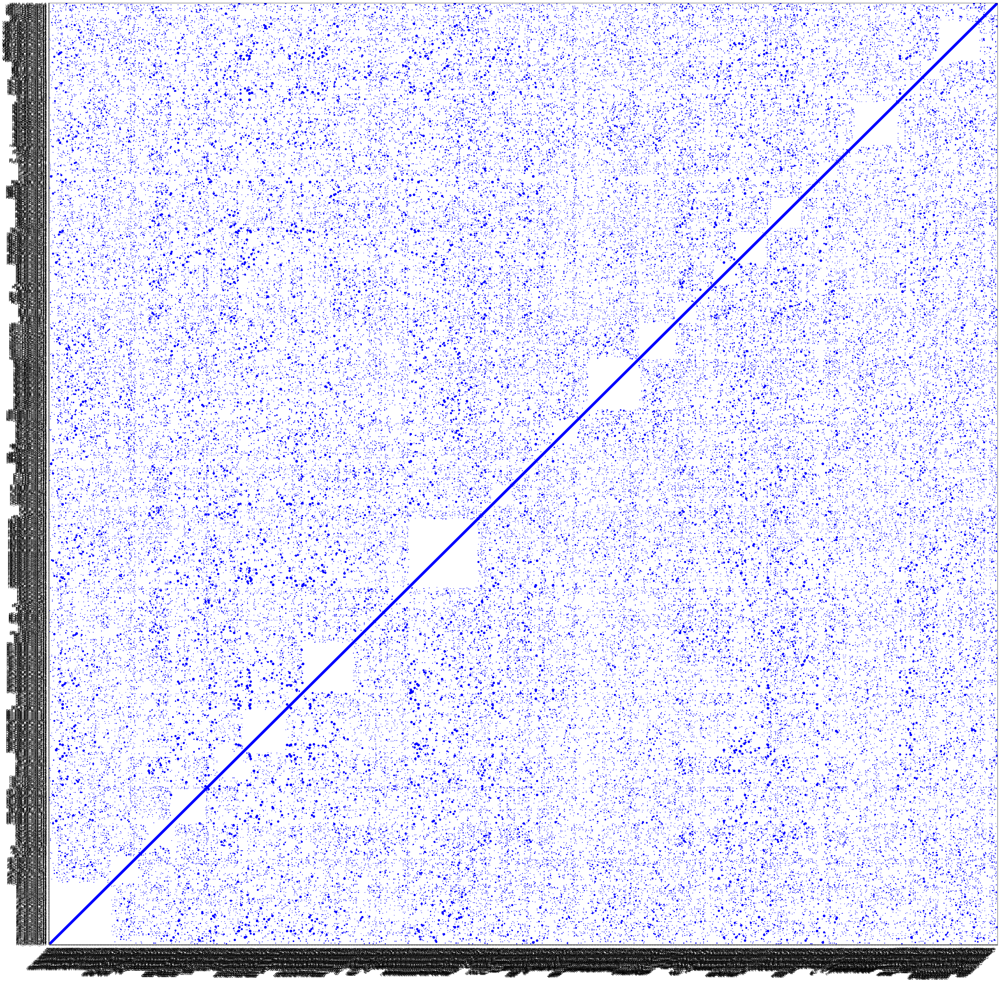

In [19]:
ct=CommunityTool()
ct.compare_modules(tlda.communities, figsize=(75,75))

In [21]:
descrDF = tlda.describe_modules()
descrDF.to_csv("diff_modules_description.tsv", sep="\t")
descrDF

/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,COV_AKI_score_median,COV_AKI_score_mean,...,AKI_score_median,AKI_score_mean,AKI_cohend,AKI_absmean-gene,AKI_absmean-disease,AKI_absmean-drug,AKI_diffmean-gene,AKI_diffmean-disease,AKI_diffmean-drug,base_condition
0,ATL_AKI_mod_225,"[BMPER, CMKLR1, DEPP1, KLF15, LTB4R, PODXL2, R...","[(R-HSA-9674519, Defective F8 sulfation at Y16...",[],[],[],[KLF15],{},-9.000000,-5.510115,...,2.084525,3.136867,3.482721,0.518939,NaN,NaN,1.168881,NaN,NaN,ATL_AKI
1,ATL_AKI_mod_57,"[AKAP13, ANKRD2, BSN, CRYAB, ERC1, HOMER1, HSP...","[(GO:1904071, presynaptic active zone assembly)]",[],[],[],[],{},-9.000000,-7.855713,...,2.670397,2.302295,2.373812,0.765152,NaN,NaN,0.052158,NaN,NaN,ATL_AKI
2,ATL_AKI_mod_215,"[CEP41, TBC1D19, TPGS1, TPGS2, TTLL1, TTLL10, ...","[(GO:0018094, protein polyglycylation), (GO:00...",[],[],[],[],{},-9.000000,-7.085670,...,1.475221,1.588830,2.907133,0.217949,NaN,NaN,0.403716,NaN,NaN,ATL_AKI
3,ATL_AKI_mod_180,"[ABHD17A, ABHD17B, ABHD17C, ARHGEF12, BRAP, DH...","[(GO:1905668, positive regulation of protein l...",[],[],[],"[MNT, ZGPAT]",{},-0.306534,-2.278786,...,1.693630,1.787612,1.780054,0.436728,NaN,NaN,0.469240,NaN,NaN,ATL_AKI
4,ATL_AKI_mod_202,"[CCL16, CHD7, GAD2, IPO7, IPO9, KPNA2, KPNA3, ...",[],"[(Orphanet:2671, Neu-Laxova syndrome)]",[],[],[ZBTB22],{},-9.000000,-5.895811,...,1.608135,1.948685,2.526223,0.227083,0.180556,NaN,-0.851072,0.995787,NaN,ATL_AKI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1481,VSM-P_H_CKD_mod_28,"[ABCA2, ABCA3, ABCG8, ACAT2, AFM, AKR7A2, AKR7...","[(GO:0097744, renal urate salt excretion), (GO...","[(EFO:1000015, aldosterone-producing adenoma)]",[],[],[HNF1B],{},-3.605916,-3.764784,...,-0.937011,-1.481293,-1.167282,0.133426,0.140292,NaN,-0.574464,-0.495548,NaN,VSM-P_H_CKD
1482,VSM-P_H_CKD_mod_220,"[AGK, ANGPTL1, BPIFB2, BPIFB4, CCNT2, DGAT1, F...","[(GO:0004144, diacylglycerol O-acyltransferase...",[],"[(CHEMBL2364624, PRADIGASTAT)]","[mir-216b, mir-29a, mir-455, mir-921]","[FOSL1, GATA2, MAX, USF1, ZBTB7A, ZFPM1]",{},0.000000,-0.698679,...,0.000000,-0.442291,-1.606011,0.107478,NaN,0.140166,-0.924266,NaN,-0.459099,VSM-P_H_CKD
1483,VSM-P_H_CKD_mod_77,"[CIAO1, CLOCK, CRTC2, DHRS11, FDX1, GATA6, HEY...","[(GO:0070859, positive regulation of bile acid...",[],[],[],"[CLOCK, GATA6, HEY2, HSF1, KLF13, SREBF2, THRB]",{},-0.062923,-2.116934,...,0.000000,-0.022451,-1.139784,0.115713,NaN,NaN,-0.075463,NaN,NaN,VSM-P_H_CKD
1484,VSM-P_H_CKD_mod_0,"[ADHFE1, AQP1, AQP2, AQP3, AQP4, AQP6, AQP7, A...","[(R-HSA-1296067, Potassium transport channels)]","[(Orphanet:112, Bartter syndrome), (Orphanet:8...",[],[],"[ATF6B, CREB3, CREB3L1, CREB3L4, CREBZF, SON]",{},-0.518662,-2.914107,...,-0.730757,-1.475875,-1.002256,0.117876,0.093154,NaN,-0.873080,-0.822610,NaN,VSM-P_H_CKD


In [22]:
geneset_overlapDF = tlda.create_overlap_df("geneset")
geneset_overlapDF.head()

27643


,celltype,module,geneset,geneset_size,geneset_name,overlap,jaccard
0,ATL,ATL_AKI_mod_225,GO:0000139,650,Golgi membrane,0.003077,0.003035
1,ATL,ATL_AKI_mod_225,GO:0000166,62,nucleotide binding,0.016129,0.013889
2,ATL,ATL_AKI_mod_225,GO:0000785,1032,chromatin,0.000969,0.000960
3,ATL,ATL_AKI_mod_225,GO:0000976,216,transcription cis-regulatory region binding,0.004630,0.004425
4,ATL,ATL_AKI_mod_225,GO:0000977,247,RNA polymerase II transcription regulatory reg...,0.004049,0.003891


In [23]:
disease_overlapDF = tlda.create_overlap_df("disease")
disease_overlapDF.head()

7184


,celltype,module,disease,disease_size,disease_name,overlap,jaccard
0,ATL,ATL_AKI_mod_225,GO:0006954,395,inflammatory response,0.010127,0.009950
1,ATL,ATL_AKI_mod_225,GO:0007601,207,visual perception,0.004831,0.004608
2,ATL,ATL_AKI_mod_225,EFO:0005091,33,monocyte count,0.030303,0.023256
3,ATL,ATL_AKI_mod_225,EFO:0004339,247,body height,0.004049,0.003891
4,ATL,ATL_AKI_mod_225,EFO:0007825,60,balding measurement,0.033333,0.028986


In [24]:
drug_overlapDF = tlda.create_overlap_df("drug")
drug_overlapDF.head()

3195


,celltype,module,drug,drug_size,drug_name,overlap,jaccard
0,ATL,ATL_AKI_mod_225,CHEMBL1742420,1,AMELUBANT,1.0000,0.090909
1,ATL,ATL_AKI_mod_225,CHEMBL329123,2,ETALOCIB,0.5000,0.083333
2,ATL,ATL_AKI_mod_57,CHEMBL628,25,PENTOXIFYLLINE,0.0800,0.044444
3,ATL,ATL_AKI_mod_57,CHEMBL574737,16,UCN-01,0.0625,0.027027
4,ATL,ATL_AKI_mod_57,CHEMBL608533,16,MIDOSTAURIN,0.0625,0.027027


In [28]:
geneset_overlapDF.to_csv("diff_modules_description_overlap_geneset.tsv", sep="\t")
disease_overlapDF.to_csv("diff_modules_description_overlap_disease.tsv", sep="\t")
drug_overlapDF.to_csv("diff_modules_description_overlap_drug.tsv", sep="\t")


In [25]:
import scanpy as sc

adata = sc.read_h5ad("kpmp.h5ad")
celltype_col="subclass.l1"
condition_col = "myconditions"

adata.obs[condition_col] = pd.Categorical(adata.obs[condition_col], ordered=True, categories=[x for x in zoneSort])

adata.obs["ct_condition"] = adata.obs[celltype_col].astype(str) + "_" + adata.obs[condition_col].astype(str)
adata.obs["ct_condition"] = pd.Categorical(adata.obs["ct_condition"])

In [ ]:
#tlda.describe_module_scrna(adata, celltype_col, condition_col, show_plot=False, plot_folder="module_plots")

In [ ]:
def enhance_kg_genesets_sloppy(inkg, ref_kg):
    eKG = nwe.extend_network(inkg.copy(), ref_kg,
                             minFraction_large=0.4, minFraction_small=0.4, 
                             node_types = ["geneset"],
                             minGeneSpec={"geneset": 0.0},
                             min_children_gs=3, max_size_gs=200, score_field="fc_score",
                             verbose=False)
    return eKG

In [26]:
descrDF.columns

Index(['name', 'gene_nodes', 'geneset_nodes', 'disease_nodes', 'drug_nodes',
       'ncRNA_nodes', 'TF_nodes', 'other_nodes', 'COV_AKI_score_median',
       'COV_AKI_score_mean', 'COV_AKI_cohend', 'COV_AKI_absmean-gene',
       'COV_AKI_absmean-disease', 'COV_AKI_absmean-drug',
       'COV_AKI_diffmean-gene', 'COV_AKI_diffmean-disease',
       'COV_AKI_diffmean-drug', 'DKD_score_median', 'DKD_score_mean',
       'DKD_cohend', 'DKD_absmean-gene', 'DKD_absmean-disease',
       'DKD_absmean-drug', 'DKD_diffmean-gene', 'DKD_diffmean-disease',
       'DKD_diffmean-drug', 'H_CKD_score_median', 'H_CKD_score_mean',
       'H_CKD_cohend', 'H_CKD_absmean-gene', 'H_CKD_absmean-disease',
       'H_CKD_absmean-drug', 'H_CKD_diffmean-gene', 'H_CKD_diffmean-disease',
       'H_CKD_diffmean-drug', 'AKI_score_median', 'AKI_score_mean',
       'AKI_cohend', 'AKI_absmean-gene', 'AKI_absmean-disease',
       'AKI_absmean-drug', 'AKI_diffmean-gene', 'AKI_diffmean-disease',
       'AKI_diffmean-drug', 'base

In [27]:
fib_rels = descrDF[(descrDF.base_condition == "FIB_COV_AKI") & (descrDF.drug_nodes.apply(len) != 0)].sort_values(["COV_AKI_score_mean"], ascending=False).head(n=2)
fib_rels

,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,COV_AKI_score_median,COV_AKI_score_mean,...,AKI_score_median,AKI_score_mean,AKI_cohend,AKI_absmean-gene,AKI_absmean-disease,AKI_absmean-drug,AKI_diffmean-gene,AKI_diffmean-disease,AKI_diffmean-drug,base_condition
656,FIB_COV_AKI_mod_89,"[ABCA10, ABCA5, ABCA6, ABCA8, ABCA9, ABCG2, AT...","[(GO:0005337, nucleoside transmembrane transpo...","[(EFO:0005059, acylcarnitine measurement)]","[(CHEMBL897, PROBENECID), (CHEMBL932, DIPYRIDA...","[mir-1, mir-95]","[ATF1, CEBPD, NFIC, TBX2]",{},3.336352,3.447657,...,1.854961,1.565909,-0.963733,0.163538,0.097526,0.253914,0.484734,0.653041,-0.015444,FIB_COV_AKI
603,FIB_COV_AKI_mod_135,"[ACKR1, ACKR2, ADRA2A, BATF3, CCL11, CCL13, CC...","[(GO:0004703, G protein-coupled receptor kinas...",[],"[(CHEMBL1742999, CARLUMAB)]",[],"[BATF3, RFX4, ZNF160, ZXDC]",{},3.036371,3.024200,...,-0.603521,-1.660360,-1.688400,0.059816,NaN,0.144596,-0.635697,NaN,-0.296367,FIB_COV_AKI


In [31]:
rel_modules = descrDF[descrDF.drug_nodes.apply(len) != 0].groupby("base_condition").head(2).reset_index(drop=True)
rel_modules

,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,COV_AKI_score_median,COV_AKI_score_mean,...,AKI_score_median,AKI_score_mean,AKI_cohend,AKI_absmean-gene,AKI_absmean-disease,AKI_absmean-drug,AKI_diffmean-gene,AKI_diffmean-disease,AKI_diffmean-drug,base_condition
0,ATL_AKI_mod_101,"[ANKRD39, CYP39A1, CYP46A1, DHCR24, DHCR7, EBP...","[(GO:0019287, isopentenyl diphosphate biosynth...","[(Orphanet:79152, Disseminated superficial act...","[(CHEMBL400599, BENFLUOREX)]",[],"[NFYB, NFYC, ZNF714]",{},-1.136590,-2.500904,...,1.034731,1.122548,1.774485,0.220430,0.156250,0.336312,0.796330,-0.010568,0.321289,ATL_AKI
1,ATL_AKI_mod_211,"[APH1B, ARHGAP32, BEX3, BLNK, CASP6, CD79A, CD...","[(GO:0017187, peptidyl-glutamic acid carboxyla...",[],"[(CHEMBL197672, EMRICASAN)]",[],"[KLF7, NFATC4, PRDM4]",{},-9.000000,-6.848288,...,4.513312,3.001274,2.944546,0.443750,NaN,0.175792,-0.433915,NaN,0.323187,ATL_AKI
2,ATL_COV_AKI_mod_91,"[FOSL2, SLC30A1, SLC30A4, SLC30A5, SLC30A6, SL...","[(GO:0005385, zinc ion transmembrane transport...",[],"[(CHEMBL4298101, LADIRATUZUMAB VEDOTIN)]","[mir-320c, mir-590, mir-663b]",[FOSL2],{},0.144285,0.592051,...,-0.228946,-2.164510,-0.849443,0.313596,NaN,0.166683,-0.955072,NaN,-0.094236,ATL_COV_AKI
3,ATL_COV_AKI_mod_105,"[AKR1C1, AKR1C2, AKR1C3, AKR1D1, ARSD, ARSF, C...","[(GO:0003865, 3-oxo-5-alpha-steroid 4-dehydrog...",[],"[(CHEMBL286738, IROSUSTAT), (CHEMBL400599, BEN...",[mir-193b],"[CREM, TFE3, TRERF1]",{},1.666357,1.985076,...,0.589728,-1.004129,-0.831269,0.488248,NaN,0.206803,-0.416918,NaN,0.077973,ATL_COV_AKI
4,ATL_DKD_mod_60,"[ADA, ADK, ADORA1, AK3, AK4, AK8, ATP2A2, CAMP...","[(GO:0006157, deoxyadenosine catabolic process)]",[],"[(CHEMBL1580, PENTOSTATIN)]","[mir-25, mir-421]",[ONECUT2],{},-0.873333,-3.703753,...,-0.679423,-3.402146,-1.198277,0.338235,NaN,0.392505,-2.547352,NaN,0.440144,ATL_DKD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,VSM-P_COV_AKI_mod_48,"[CDC14A, CYBRD1, DSE, ESPL1, LYPLA1, MTF1, PDS...","[(GO:0005385, zinc ion transmembrane transport...",[],"[(CHEMBL4298101, LADIRATUZUMAB VEDOTIN)]","[mir-124, mir-301a, mir-424, mir-503]",[MTF1],{},0.810990,1.080705,...,-0.432716,-0.612372,-1.125081,0.179872,NaN,0.060296,-0.534691,NaN,-0.075114,VSM-P_COV_AKI
95,VSM-P_DKD_mod_114,"[ABL2, ADGRL1, ALK, ART3, CDH5, EML4, MAK, MAS...","[(R-HSA-427589, Type II Na+/Pi cotransporters)]",[],"[(CHEMBL1983268, ENTRECTINIB)]",[],[RORA],{},-9.000000,-4.247480,...,-0.837822,-3.108584,-1.242928,0.311359,NaN,0.424114,-0.282253,NaN,-0.403196,VSM-P_DKD
96,VSM-P_DKD_mod_74,"[ACSM3, ADAM22, ADCY2, ADCY8, ADM, AKAP5, ATP2...","[(GO:0004972, NMDA glutamate receptor activity...","[(EFO:0001064, Down syndrome), (EFO:0004321, a...","[(CHEMBL742, KETAMINE)]","[mir-103a, mir-133a, mir-138, mir-143, mir-145...",[],{},-9.000000,-5.889685,...,-0.936507,-2.813540,-0.988181,0.245086,0.064825,0.109838,-0.545597,0.472103,-0.262666,VSM-P_DKD
97,VSM-P_H_CKD_mod_65,"[CAMK1, CCBE1, ERV3-1, ERVFRD-1, FBXL12, GCM1,...","[(GO:0060143, positive regulation of syncytium...","[(EFO:0009322, proliferative diabetic retinopa...","[(CHEMBL2108313, CONBERCEPT)]",[],[GCM1],{},-9.000000,-6.666143,...,-2.782250,-3.889817,-1.427254,0.058474,0.125140,0.172799,-3.044895,0.751375,-0.210353,VSM-P_H_CKD


In [ ]:
%%capture captured_describe_module

tlda.describe_module_scrna(adata, celltype_col, condition_col, module_names=list(rel_modules.name), show_plot=False, plot_folder="module_plots")

disease 7184
geneset 27643
drug 3195
['MVP', 'NSDHL', 'MVK', 'NFYC', 'HMGCR', 'LBR', 'CYP46A1', 'TRAF3IP2', 'LMNB2', 'ANKRD39', 'DHCR7', 'TJAP1', 'DHCR24', 'PMVK', 'HSD17B7', 'IDI1', 'TM7SF2', 'ZNF714', 'SQLE', 'MVD', 'SC5D', 'TMTC4', 'VPS52', 'CYP39A1', 'EBP', 'TEDC1', 'SOAT1', 'NFYB', 'FDPS', 'WDCP', 'MSMO1']
40
Saving plot for module ATL_AKI_mod_101 :  module_plots/overview_plot_ATL_AKI_mod_101.png
['NFATC4', 'MAGED1', 'FURIN', 'ARHGAP32', 'DNM2', 'NGF', 'GGCX', 'APH1B', 'DNM3', 'CASP6', 'SORCS2', 'FRS3', 'FAIM', 'RIT1', 'LCN2', 'CD79A', 'EPB41L1', 'DFFA', 'FBXO38', 'MSN', 'KIDINS220', 'IKBKG', 'SH2B1', 'PRDM4', 'KLF7', 'VKORC1L1', 'BEX3', 'DNAJA3', 'CD79B', 'MMP7', 'PROZ', 'EHD4', 'SMPD2', 'PRKCI', 'BLNK', 'DYNLT1', 'FRS2', 'RHOG', 'PCSK6', 'LRRFIP1']
40
Saving plot for module ATL_AKI_mod_211 :  module_plots/overview_plot_ATL_AKI_mod_211.png
['SLC39A5', 'SLC39A13', 'SLC30A9', 'SLC30A6', 'FOSL2', 'SLC30A4', 'SMARCC2', 'SLC39A9', 'SMC3', 'SLC39A7', 'SLC39A10', 'SLC30A7', 'SLC39A6', '

/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outfile)
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outfile)
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outfile)
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(outfile)
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatibl

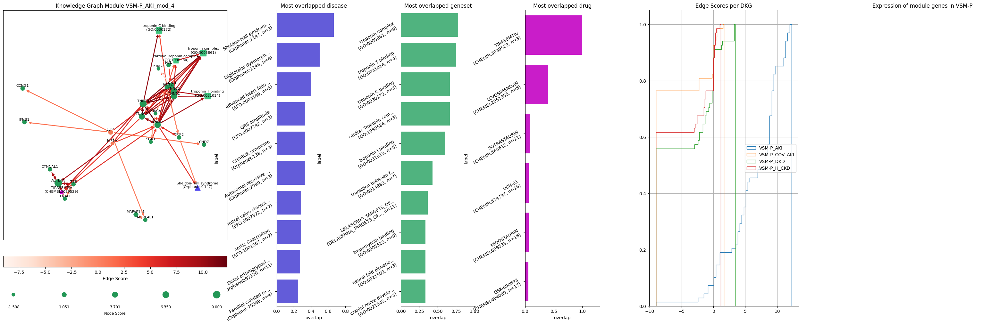

In [54]:
captured_describe_module()

In [48]:
from huggingface_hub import hf_hub_download
from llama_cpp import Llama

class AIDescriptor:

    def __init__(self, model_name = "LoneStriker/BioMistral-7B-DARE-GGUF", model_file = "BioMistral-7B-DARE-Q4_K_M.gguf", local_dir="../llm_addon/model/"):
        # GLOBAL VARIABLES

        self.model_name = model_name
        self.model_file = model_file
        self.local_dir = local_dir
        
        self.model_path = hf_hub_download(self.model_name, filename=self.model_file, local_dir=self.local_dir)

        # LOAD THE MODEL
        self.llm = Llama(
            model_path=self.model_path,
            n_ctx=2048,  # Context length to use
            n_threads=16,            # Number of CPU threads to use
            n_gpu_layers=0,        # Number of model layers to offload to GPU
            verbose=False,
        )


    def query_genelist(self, gene_list, context=None, verbose=False):

        

        ## Generation kwargs
        generation_kwargs = {
            "max_tokens":-1,
            "stop":["</s>"],
            "echo":False, # Echo the prompt in the output
            "top_k":1, # This is essentially greedy decoding, since the model will always return the highest-probability token. Set this value > 1 for sampling decoding
            "temperature": 0.9
        }
        
        ## Run inference
        geneList = ("blood", ["IFI27", "IFITM1", "IFITM3", "IFIT2", "IFIT1", "MT2A", "IFI6", "SIGLEC1", "IFIT3", "RSAD2", "ISG15", "LY6E", "IFI44L", "MX1"])
        #geneList = ("kidney", ['NOG', 'LHCGR', 'DIO2', 'NPR1', 'SLC8A1', 'NR2F1', 'EGFL7', 'JARID2', 'HJV', 'PLOD1', 'SHOX2', 'ADRB3', 'TBX3', 'ATP11B', 'COX6C', 'BMPR1A', 'APOC3', 'CALR', 'ATF2', 'TPO', 'FGF10', 'NCOR2', 'RBM19', 'LMBR1L', 'TRMT1', 'FOXH1', 'ELSPBP1', 'TBX18', 'ME3', 'RGMB', 'LEMD3', 'ACOT11', 'PCP2', 'TBX6', 'TBX20', 'RGMA', 'ANK2', 'BMP5', 'GATA5', 'ZFYVE16', 'SCGB1A1', 'SMAD9', 'SLC47A1', 'NOS3', 'HIPK1', 'SUMO1', 'DRAP1', 'BMP2', 'BMPR2', 'CHRDL1', 'TBX1', 'LYL1', 'NKX2-5', 'APOA2', 'GJA5', 'APOA4', 'SLC5A5', 'HMGA2', 'ACTA2', 'HIPK2', 'DHX9', 'CHRD', 'MOV10L1', 'ACVRL1', 'PKD1', 'HFE', 'TBX5', 'CCDC89', 'SERPINB3', 'PRKD3', 'SIRT1', 'PLA2G1B', 'ETV2', 'mir-513a', 'SRA1', 'mir-320a', 'mir-1', 'mir-214', 'mir-223', 'mir-185', 'mir-125b', 'mir-155', 'mir-137', 'mir-206', 'mir-4271', 'mir-122', 'mir-647', 'mir-335', 'mir-543', 'mir-19b', 'mir-92a', 'mir-106a', 'mir-96', 'mir-143', 'mir-145', 'mir-17', 'mir-18a', 'mir-19a', 'mir-20a', 'mir-21', 'mir-141', 'mir-181a', 'mir-27a', 'mir-200a', 'mir-200b'])

        contextString = ""

        if not context is None:
            contextString = " in {}".format(context)
        
        genePrompt = "The following genes are dysregulated{}: {}. How are these genes connected and which molecular functions are altered?".format(contextString,", ".join([str(x) for x in gene_list]))
        
        prompt = """Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: {}

Do not repeat functions of single genes. Highlight genes for which a clinical trial is running or has been completed.

Only return the helpful answer. Answer must be concise, detailed and well explained.
Helpful answer:
        """.format(genePrompt)

        if verbose:
            print(prompt)
                
        res = self.llm(prompt, **generation_kwargs) # Res is a dictionary
        
        ## Unpack and the generated text from the LLM response dictionary and print it
        return res["choices"][0]["text"].strip()


In [49]:
aid = AIDescriptor()

aid.query_genelist(tlda.communities["VSM-P_DKD_mod_114"], "kidney vascular smooth muscle cells", verbose=True)


Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in kidney vascular smooth muscle cells: ROS1, RORA, SLC17A1, SQSTM1, ALK, SLC34A1, SLC34A2, ABL2, MAST2, PARP1, ADGRL1, PHEX, SLC34A3, ART3, MAK, EML4, PRKD2, SMS, CDH5. How are these genes connected and which molecular functions are altered?

Do not repeat functions of single genes. Highlight genes for which a clinical trial is running or has been completed.

Only return the helpful answer. Answer must be concise, detailed and well explained.
Helpful answer:
        


'The dysregulated genes in kidney vascular smooth muscle cells are involved in various molecular functions such as cellular metabolic processes, cell signaling, cell cycle regulation, protein degradation, and cell adhesion. The ROS1 gene is a receptor tyrosine kinase that plays a role in cell proliferation, differentiation, and survival. It is involved in the PI3K/AKT pathway and is overexpressed in various cancers. The RORA gene encodes a nuclear hormone receptor that regulates gene expression and is involved in cell cycle regulation. The SLC17A1 gene encodes a transporter protein that is involved in the transport of amino acids across cell membranes. The SQSTM1 gene encodes an autophagy-related protein that plays a role in protein degradation. The ALK gene encodes a receptor tyrosine kinase that is involved in cell proliferation and differentiation. The SLC34A1 and SLC34A2 genes encode transporter proteins that are involved in the transport of bicarbonate ions across cell membranes. 

In [ ]:
descrDF.